# Compressive Strength of Concrete 
Project aims is to predict the compressive strength of concrete from it's mixture ingredient and age

In [1]:
import matplotlib.pyplot as plt 
import numpy as np 
import pandas as pd 
import seaborn as sns
import warnings

RANDOM_STATE = 42
warnings.filterwarnings("ignore")
dataset = pd.read_excel("Concrete_Data.xls")

In [2]:
dataset.info()
print(dataset.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   Cement (component 1)(kg in a m^3 mixture)              1030 non-null   float64
 1   Blast Furnace Slag (component 2)(kg in a m^3 mixture)  1030 non-null   float64
 2   Fly Ash (component 3)(kg in a m^3 mixture)             1030 non-null   float64
 3   Water  (component 4)(kg in a m^3 mixture)              1030 non-null   float64
 4   Superplasticizer (component 5)(kg in a m^3 mixture)    1030 non-null   float64
 5   Coarse Aggregate  (component 6)(kg in a m^3 mixture)   1030 non-null   float64
 6   Fine Aggregate (component 7)(kg in a m^3 mixture)      1030 non-null   float64
 7   Age (day)                                              1030 non-null   int64  
 8   Concrete compressive strength(MPa, megapascals)  

In [3]:
dataset.head()

,Cement (component 1)(kg in a m^3 mixture),Blast Furnace Slag (component 2)(kg in a m^3 mixture),Fly Ash (component 3)(kg in a m^3 mixture),Water (component 4)(kg in a m^3 mixture),Superplasticizer (component 5)(kg in a m^3 mixture),Coarse Aggregate (component 6)(kg in a m^3 mixture),Fine Aggregate (component 7)(kg in a m^3 mixture),Age (day),"Concrete compressive strength(MPa, megapascals)"
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.986111
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.887366
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.269535
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.052780
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.296075


In [4]:

# Cement (component 1)(kg in a m^3 mixture)
# Blast Furnace Slag (component 2)(kg in a m^3 mixture)
# Fly Ash (component 3)(kg in a m^3 mixture)
# Water  (component 4)(kg in a m^3 mixture)
# Superplasticizer (component 5)(kg in a m^3 mixture)
# Coarse Aggregate  (component 6)(kg in a m^3 mixture)
# Fine Aggregate (component 7)(kg in a m^3 mixture)
# Age (day)
# Concrete compressive strength(MPa, megapascals)

# Rename the columns for better visualization
dataset.columns = ['Cement', 'Blast Furnace Slag', 'FlyAsh', 'Water', 'Superplasticizer', 'Coarse Aggregate', 'Fine Aggregate', "Age Day", 'Compressive Strength']


In [5]:
dataset.head()

,Cement,Blast Furnace Slag,FlyAsh,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age Day,Compressive Strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.986111
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.887366
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.269535
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.052780
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.296075


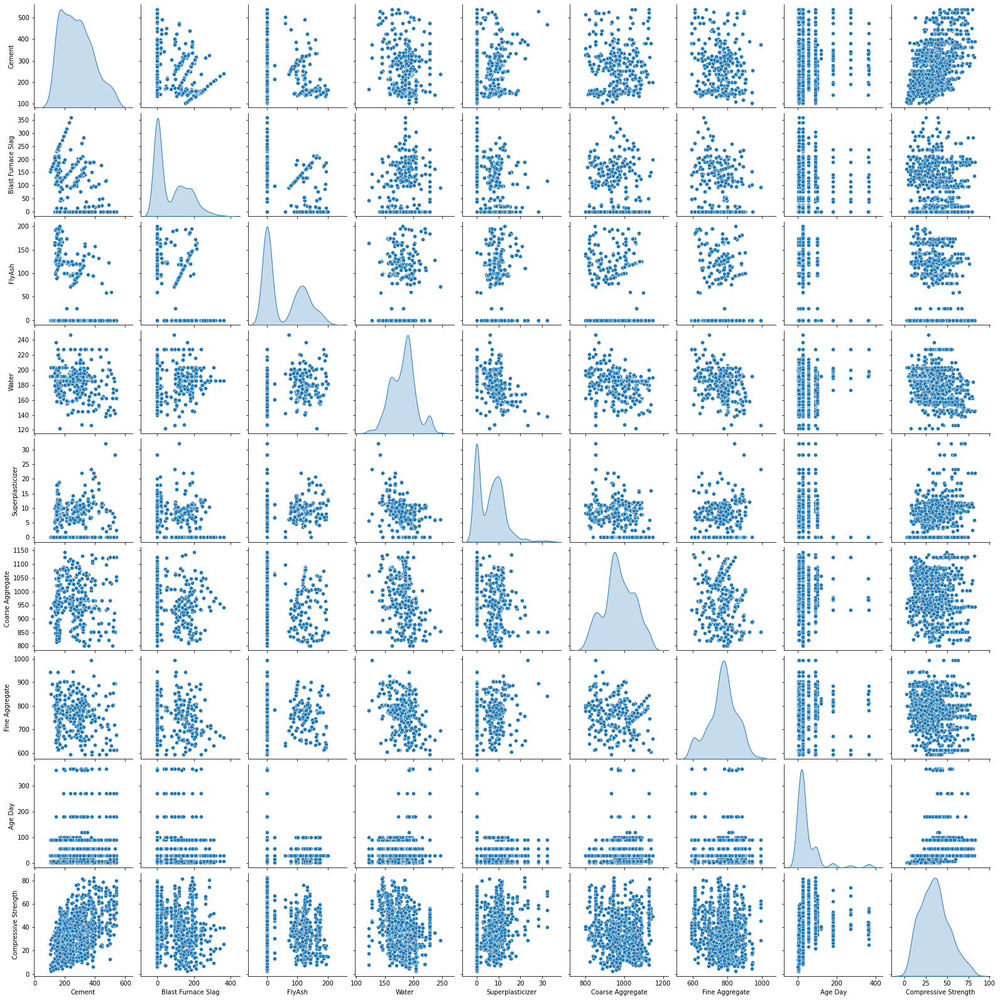

In [6]:
sns.pairplot(dataset, diag_kind = "kde")
plt.show()

# Not all features are perfectly normally distributed. Should be normalised
# All features should be scaled to ensure they are on a similar scale
# At first glance, there doesn't seem to be any high correlation between any 2 features. 
# Although Cement and Compressive Strength look like they may have some correlation. 
# Let's determine the Pearson Correlation coefficients to get a numerical value of the strength of the correlations.

From the pairplot we can see a strong correlation between the cement and the compressive strength, because we can see an uptrend and it is too disperse compare to the others 

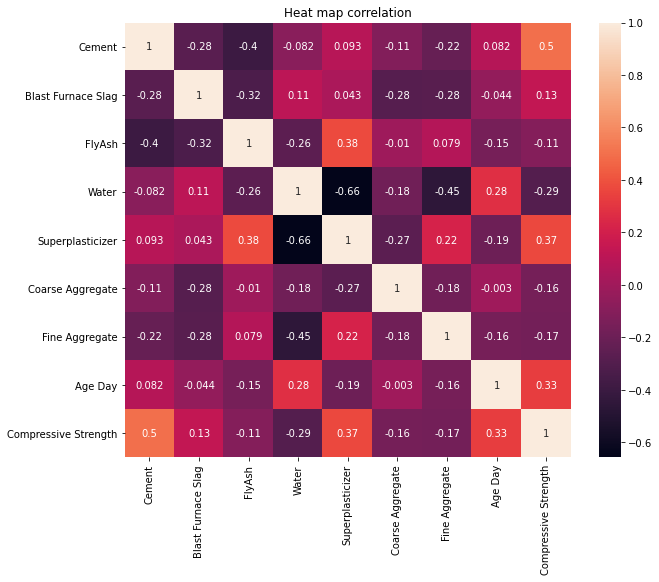

In [7]:
corr = dataset.corr()

plt.figure(figsize = (10,8))
sns.heatmap(corr, annot = True)
plt.title('Heat map correlation')
plt.show()

# Preprocessing Technique

In [8]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

X = dataset.iloc[:, dataset.columns != 'Compressive Strength']
y = dataset['Compressive Strength']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = RANDOM_STATE)
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.5, random_state = RANDOM_STATE)

sc = StandardScaler()

X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
X_val = sc.transform(X_val)

# Algorithms Model

Random Forest Regressor Model

In [9]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn import tree

rfr = RandomForestRegressor()

rfr_param = {
    "criterion": ['mse'], 
    "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90,100], 
    "max_features":["auto","log2","sqrt",None]}

grid_rfr = GridSearchCV(rfr, param_grid = rfr_param, return_train_score=True)

hyp_rfr = grid_rfr.fit(X_train,y_train)

hyp_rfr.best_params_

{'criterion': 'mse', 'max_features': 'auto', 'max_leaf_nodes': None}

In [10]:
rfr_model = RandomForestRegressor(criterion = 'mse', max_features = None, max_leaf_nodes = None, random_state = RANDOM_STATE)

rfr_model.fit(X_train, y_train)

RandomForestRegressor(max_features=None, random_state=42)

In [11]:
y_pred_rfr = rfr_model.predict(X_test)

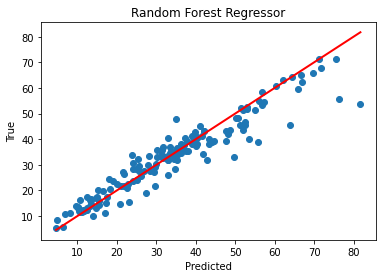

In [12]:
plt.scatter(y_test, y_pred_rfr) 
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'red', lw=2) 
plt.xlabel("Predicted") 
plt.ylabel("True") 
plt.title("Random Forest Regressor")
plt.show()

The scatter look quite good on the Random Forest Regression model

Root Mean Square Error (RMSE)
RMSE is the square root of the error function that the regression algorithms are trying to reduce. It is an absolute measure of how well the model fits the data.

Mean Absolute Error (MAE)
Similarly to RMSE, MAE looks at the sum of the value of errors. However, since we are not squaring the value and instead taking the absolute value, it is more forgiving to large prediction errors.

R Square
R Square measures how much variability in a dependent variable can be explained by the model. It is a good metric to determine the fit on dependent variables. But, it does not take into consideration overfitting.

In [13]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

results = {}
    
results[type(rfr_model).__name__] = [mean_squared_error(y_test, y_pred_rfr, squared = False), 
                                     mean_absolute_error(y_test, y_pred_rfr), 
                                     r2_score(y_test, y_pred_rfr)]
        
results = pd.DataFrame(results, index=['RMSE','MAE','R2'])

results

,RandomForestRegressor
RMSE,5.424867
MAE,3.581513
R2,0.897955


Lasso model

In [14]:
from sklearn.linear_model import Lasso

lasso = Lasso()

l_param = {'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]}

grid_lasso = GridSearchCV(lasso, param_grid = l_param, cv = 5, scoring = "r2")

hyp_lasso = grid_lasso.fit(X_train, y_train)

hyp_lasso.best_params_

{'alpha': 0.01}

In [15]:

l_model = Lasso(alpha = 0.01, random_state = RANDOM_STATE)
l_model.fit(X_train, y_train)

Lasso(alpha=0.01, random_state=42)

In [16]:
y_pred_l = l_model.predict(X_test)

In [17]:
results = {}
    
results[type(l_model).__name__] = [mean_squared_error(y_test, y_pred_l, squared = False), 
                                     mean_absolute_error(y_test, y_pred_l), 
                                     r2_score(y_test, y_pred_l)]
        
results = pd.DataFrame(results, index=['RMSE','MAE','R2'])

results

,Lasso
RMSE,10.967095
MAE,8.722851
R2,0.582944


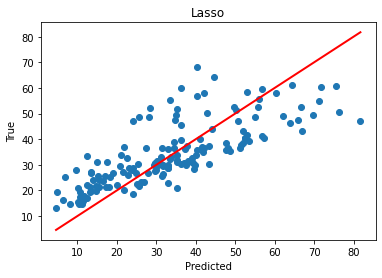

In [20]:
plt.scatter(y_test, y_pred_l) 
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'red', lw=2) 
plt.xlabel("Predicted") 
plt.ylabel("True") 
plt.title("Lasso")
plt.show()

In [29]:
# Let's Plot LogisticRegression Learning Curve
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import learning_curve

def plot_learning_curve(estimator1, estimator2, X, y, ylim=None, cv=None, n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)): 
    
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(20,10), sharey=True)

    if ylim is not None:
        plt.ylim(*ylim)

    # First Estimator
    train_sizes, train_scores, test_scores = learning_curve(estimator1, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)

    ax1.plot(train_sizes, np.mean(train_scores, axis=1), 'o-', color="#ff9124", label="Training score")
    ax1.plot(train_sizes, np.mean(test_scores, axis=1), 'o-', color="#2492ff", label="Cross-validation score")

    ax1.set_title("Logistic Regression Learning Curve", fontsize=14)
    ax1.set_xlabel('Training size (m)')
    ax1.set_ylabel('Score')
    ax1.grid(True)
    ax1.legend(loc="best")

    # Second Estimator 
    train_sizes, train_scores, test_scores = learning_curve( estimator2, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)

    ax2.plot(train_sizes, np.mean(train_scores, axis=1), 'o-', color="#ff9124", label="Training score")
    ax2.plot(train_sizes, np.mean(test_scores, axis=1), 'o-', color="#2492ff", label="Cross-validation score")

    ax2.set_title("Random Forest Learning Curve", fontsize=14)
    ax2.set_xlabel('Training size (m)')
    ax2.set_ylabel('Score')
    ax2.grid(True)
    ax2.legend(loc="best")

    return plt

<module 'matplotlib.pyplot' from 'D:\\Python\\lib\\site-packages\\matplotlib\\pyplot.py'>

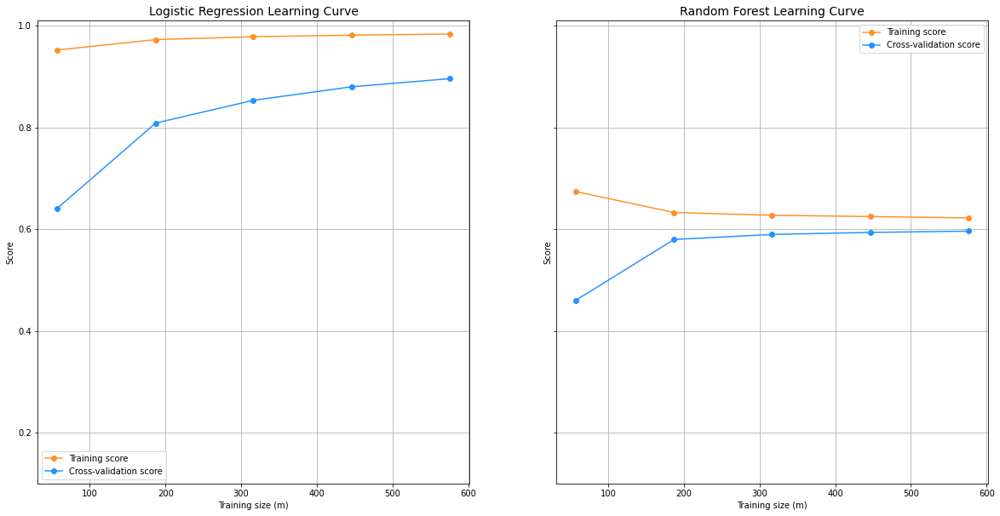

In [30]:
cv = ShuffleSplit(n_splits=100, test_size=0.2, random_state=0)

plot_learning_curve(rfr_model, l_model, X_train, y_train, (0.1, 1.01), cv=cv, n_jobs=2)

In [23]:
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Activation
from keras.layers.core import Dense
from keras.metrics import categorical_crossentropy

n_inputs = X_train.shape[1]

nn = Sequential([
    Dense(n_inputs, input_shape=(n_inputs, ), activation='relu'),
    Dense(32, activation='relu'),
    Dense(1)
])

In [24]:
nn.compile(optimizer= keras.optimizers.Adam(lr = 0.01), loss='mse',metrics=['mae']) 

In [25]:
nn_model = nn.fit(X_train, y_train, epochs = 50,validation_data=(X_val, y_val))

Epoch 1/50
23/23 [==============================] - 0s 9ms/step - loss: 1350.7406 - mae: 32.4926 - val_loss: 836.8585 - val_mae: 24.7694
Epoch 2/50
23/23 [==============================] - 0s 2ms/step - loss: 510.4435 - mae: 17.7147 - val_loss: 192.7150 - val_mae: 10.7782
Epoch 3/50
23/23 [==============================] - 0s 2ms/step - loss: 210.4339 - mae: 11.6595 - val_loss: 154.4353 - val_mae: 10.1747
Epoch 4/50
23/23 [==============================] - 0s 2ms/step - loss: 167.2702 - mae: 10.4897 - val_loss: 134.3062 - val_mae: 9.5786
Epoch 5/50
23/23 [==============================] - 0s 2ms/step - loss: 147.5061 - mae: 9.9792 - val_loss: 124.5153 - val_mae: 9.2329
Epoch 6/50
23/23 [==============================] - 0s 2ms/step - loss: 137.9286 - mae: 9.6724 - val_loss: 117.2198 - val_mae: 8.8778
Epoch 7/50
23/23 [==============================] - 0s 2ms/step - loss: 133.0446 - mae: 9.4128 - val_loss: 118.0532 - val_mae: 8.8557
Epoch 8/50
23/23 [==============================] - 0s

<AxesSubplot:>

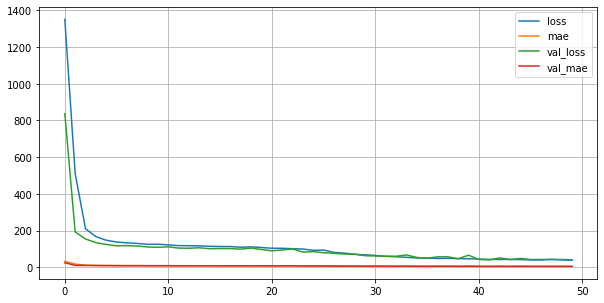

In [26]:
pd.DataFrame(nn_model.history).plot(figsize=(10,5))
plt.grid(True)
plt.gca()


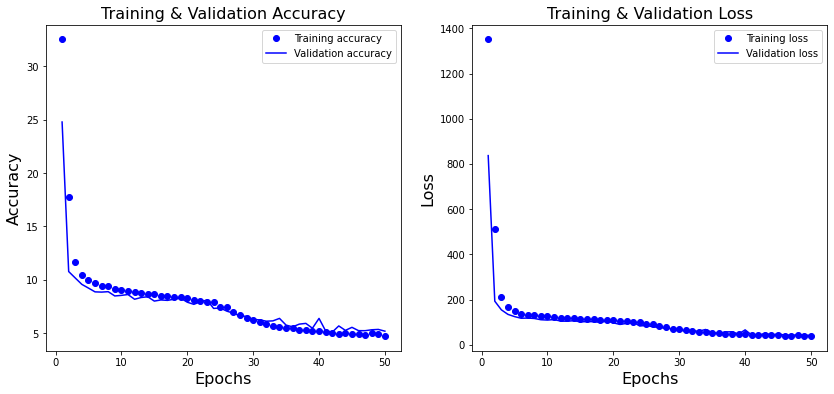

In [27]:
history_dict = nn_model.history
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
accuracy = history_dict['mae']
val_accuracy = history_dict['val_mae']
 
epochs = range(1, len(loss_values) + 1)
fig, ax = plt.subplots(1, 2, figsize=(14, 6))
#
# Plot the model accuracy (MAE) vs Epochs
#
ax[0].plot(epochs, accuracy, 'bo', label='Training accuracy')
ax[0].plot(epochs, val_accuracy, 'b', label='Validation accuracy')
ax[0].set_title('Training & Validation Accuracy', fontsize=16)
ax[0].set_xlabel('Epochs', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].legend()
#
# Plot the loss vs Epochs
#
ax[1].plot(epochs, loss_values, 'bo', label='Training loss')
ax[1].plot(epochs, val_loss_values, 'b', label='Validation loss')
ax[1].set_title('Training & Validation Loss', fontsize=16)
ax[1].set_xlabel('Epochs', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].legend()

In [28]:
nn_model.model.evaluate(X_test, y_test)

5/5 [==============================] - 0s 1ms/step - loss: 45.9781 - mae: 5.1272


[45.97813034057617, 5.1272454261779785]